# Multiome Data Cell Type Reannotation

In [1]:
# scverse packages
import anndata as ad
import scanpy as sc
import mudata as md
import muon as mu

# useful standard lib packages
import os

# plotting
import matplotlib.pyplot as plt
import seaborn as sns

# standard cell type tool (for validation)
import celltypist

# data science
import numpy as np
import pandas as pd

In [2]:
sc.set_figure_params(dpi=200)

## Loading scRNA-seq and multiome data

In [3]:
# if directory doesn't exist, create it
!mkdir -p ../data

# download multiome_counts.h5ad
!aws s3 cp s3://openproblems-bio/public/neurips-2023-competition/multiome_counts.h5mu ../data/multiome_counts.h5mu --no-sign-request

download: s3://openproblems-bio/public/neurips-2023-competition/multiome_counts.h5mu to ../data/multiome_counts.h5mu


In [4]:
mdata_adata_path = os.path.join('../data', 'multiome_counts.h5mu')
mdata = md.read_h5mu(mdata_adata_path)

In [5]:
mdata

MuData object with n_obs × n_vars = 26335 × 152856
  obs:	'donor_id'
  var:	'gene_ids', 'feature_types', 'genome', 'interval', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
  2 modalities
    rna:	26335 x 17438
      obs:	'library', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'n_genes', 'doublet_scores', 'doublet_scores_smoothed', 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'cell_type'
      var:	'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
      uns:	'cell_type_colors', 'hvg', 'leiden', 'library_colors', 'log1p', 'neighbors', 'pca', 'umap'
      obsm:	'X_pca', 'X_umap', 'ora_estimate', 'ora_pvals'
      varm:	'PCs'
      obsp:	'connectivities', 'distances'
    atac:	26335 x 135418
      obs:	'n_features_per_cell', 'total_fragment_counts', 'log_total_fragment_counts', 'nucleosome_signal', 'tss_score', 'nuc_signal_filter', 'cell_type', 'lsi_1', 'leiden_allcomps', 'leiden_corrRemoved'
      var:	'gene_ids', 'feature_types', 'genome', 'interval', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
      uns:	'allcomps', 'cell_type_colors', 'corrRemoved', 'files', 'leiden', 'leiden_allcomps_colors', 'leiden_corrRemoved_colors', 'lsi', 'umap'
      obsm:	'X_lsi', 'X_lsi_corrRemoved', 'X_umap', 'X_umap_allcomps', 'X_umap_corrRemoved'
      varm:	'LSI'
      layers:	'binarized'
      obsp:	'allcomps_connectivities', 'allcomps_distances', 'corrRemoved_connectivities', 'corrRemoved_distances'

In [6]:
mdata['rna'].obs['donor_id'] = mdata.obs['donor_id']
mdata['atac'].obs['donor_id'] = mdata.obs['donor_id']

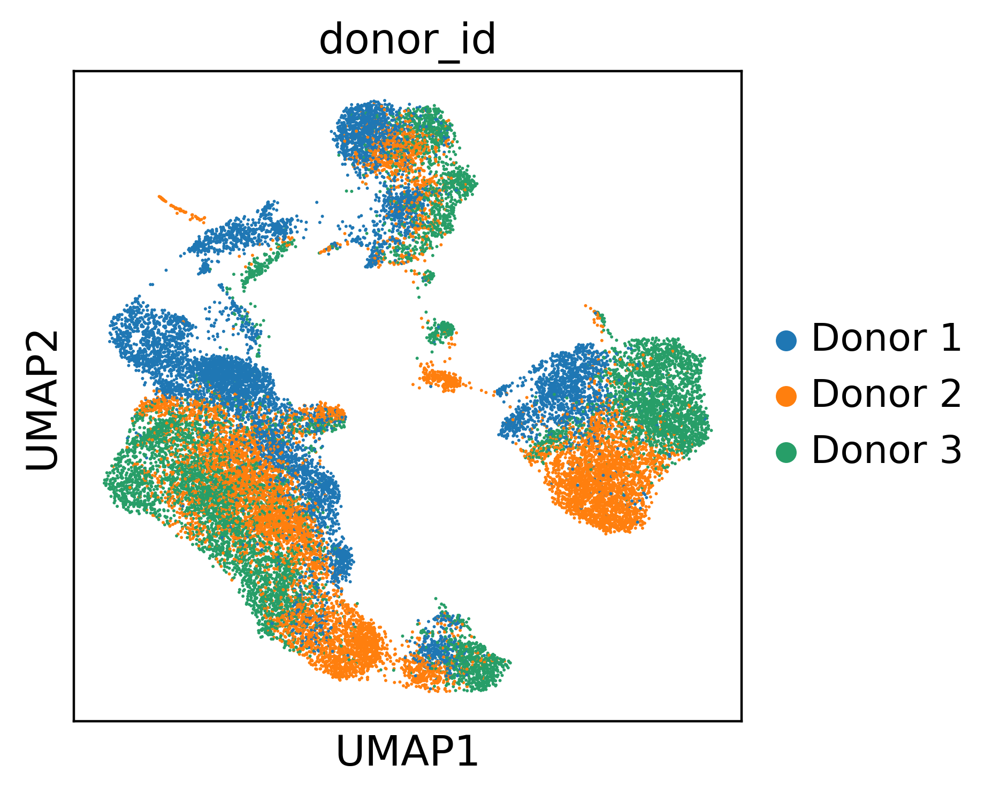

In [7]:
sc.pl.umap(
    mdata['rna'], 
    color=['donor_id'], 
    #legend_loc="on data",
)

## Annotating cell types

### Helper functions

In [8]:
def plot_marker_expression(adata, markers, groupby):
    """
    This function plots the expression of given markers across specified groups (e.g., cell types).
    
    Parameters:
        adata (AnnData): The annotated data matrix of shape (n_obs, n_vars). Rows correspond to cells and columns to genes.
        markers (dict): A dictionary where keys are the cell types and values are lists of markers associated with each cell type.
        groupby (str): The key in adata.obs that corresponds to the grouping variable (e.g., predicted cell type).
    """
    # Initialize the figure
    num_types = len(markers)
    fig, axs = plt.subplots(1, num_types, figsize=(5*num_types, 5), squeeze=False)

    for i, (cell_type, marker_list) in enumerate(markers.items()):
        # Filter data for the markers of the current cell type
        
        adata_genes = set(adata.var_names)
        marker_list = list(adata_genes.intersection(marker_list))
        
        sc.pl.dotplot(adata, var_names=marker_list, groupby=groupby, ax=axs[0, i], show=False)
        axs[0, i].set_title(f'{cell_type} Markers')

    plt.tight_layout()
    plt.show()

In [9]:
# CD3, CD8, CD19, CD56, CD11c, TCRgd, CD123 identified in https://www.ncbi.nlm.nih.gov/pmc/articles/PMC9905713/
# markers from https://sctype.app/database.php and Yoshida2022
markers_t_nk = {
    'NK': [
        "NCAM1",
        "KLRB1",
        "NCR1",
        "CD2",
        "CD69",
        "NKG7",
        "GZMB",
        "GZMA",
        "GZMM",
        "FCGR3A",
        "GNLY",
        "COX6A2",
        "ZMAT4",
        "KIR2DL4",
        "NKG7"
    ],
    'T cells': [    
        "CD2",
        "CD8A",
        "CD4",
        "CD3D",
        "CD3E",
        "CD3G",
        "CD27",
        "FOXP3",
        "CCR7",
        "CCR6",
        "CD6",
        "CTLA4",
        "IL2RA",
        "GZMB",
        "PTPRC",
        "TRDV2",
        "TRGV9",
        "TRGC1",
    ],
    "B cells": [
        "CD19",
        "CD27",
        "CD38",
        "CD24",
        "MS4A1",
        "PTPRC",
        "PAX5",
        "CD24",
        "CD38",
        "CD79A",
        "JCHAIN",
        "SSR4",
        "FKBP11",
        "SEC11C",
        "DERL3",
        "PRDX4",
        "IGLL5",
        "CD79B",
        "TCL1A",
        "IGLL5",
        "HLA-DQA1",
        "HLA-DQB1",
        "CD38",
        "VPREB3",
        "IGLL5"
    ],
    "Myeloid cells": [
        "ITGAX",
        "CD14",
        "CD68",
        "CD163",
        "CD83",
        "CD1C"
    ]
}

In [10]:
celltypist_label_mapping = {
    'B cells': 'B cells',
    'Plasma cells': 'B cells',
    'B-cell lineage': 'B cells',
    'T cells': 'T cells',
    'Double-positive thymocytes': 'T cells',
    'Macrophages': 'Myeloid cells',
    'DC': 'Myeloid cells',
    'Monocytes': 'Myeloid cells',
    'Mono-mac': 'Myeloid cells',
    'Myelocytes': 'Myeloid cells',
    'pDC': 'Myeloid cells',
    'Monocyte precursor': 'Myeloid cells',
    'Early MK': 'Myeloid cells',
    'Erythrocytes': 'Myeloid cells',
    'Erythroid': 'Myeloid cells',
    'DC precursor': 'Myeloid cells',
    'pDC precursor': 'Myeloid cells',
    'Megakaryocyte precursor': 'Myeloid cells',
    'Mast cells': 'Myeloid cells',
    'ILC': 'NK cells',
    'ILC precursor': 'NK cells',
    # Additional or exceptional mappings
    'HSC/MPP': 'Other',  # You might categorize differently or exclude
    'Cycling cells': 'Other',  # or based on additional context
    'Epithelial cells': 'Other',  # not part of the immune classification
}

celltypist_immune_model = celltypist.models.Model.load(model = 'Immune_All_High.pkl')

### Donor 1

In [11]:
donor_1_selection = mdata['rna'].obs['donor_id'].eq("Donor 1")
donor_1_mdata = mdata[donor_1_selection].copy()

In [12]:
donor_1_mdata['rna']

AnnData object with n_obs × n_vars = 8495 × 17438
    obs: 'library', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'n_genes', 'doublet_scores', 'doublet_scores_smoothed', 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'cell_type', 'donor_id'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'hvg', 'leiden', 'library_colors', 'log1p', 'neighbors', 'pca', 'umap', 'donor_id_colors'
    obsm: 'X_pca', 'X_umap', 'ora_estimate', 'ora_pvals'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [13]:
donor_1_mdata['rna'].obs = donor_1_mdata['rna'].obs.drop(columns=['leiden_1.0'])
sc.pp.highly_variable_genes(donor_1_mdata['rna'], flavor='cell_ranger', n_top_genes=4000)

sc.pp.pca(donor_1_mdata['rna'], n_comps=20, use_highly_variable=True)
sc.pp.neighbors(donor_1_mdata['rna'])
sc.tl.umap(donor_1_mdata['rna'])

sc.tl.leiden(
    donor_1_mdata['rna'], 
    resolution=0.25, 
    key_added="leiden_0.25", 
    random_state=0,
)

In [14]:
cell_type_predictions = celltypist.annotate(
    mdata['rna'], 
    model=celltypist_immune_model, 
    majority_voting=True,
)

donor_1_mdata['rna'].obs["celltypist_label"] = cell_type_predictions.predicted_labels.predicted_labels
donor_1_mdata['rna'].obs['celltypist_label'] = donor_1_mdata['rna'].obs['celltypist_label'].map(celltypist_label_mapping).fillna('Other')

🔬 Input data has 26335 cells and 17438 genes
🔗 Matching reference genes in the model
🧬 4941 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 15
🗳️ Majority voting the predictions
✅ Majority voting done!


... storing 'celltypist_label' as categorical


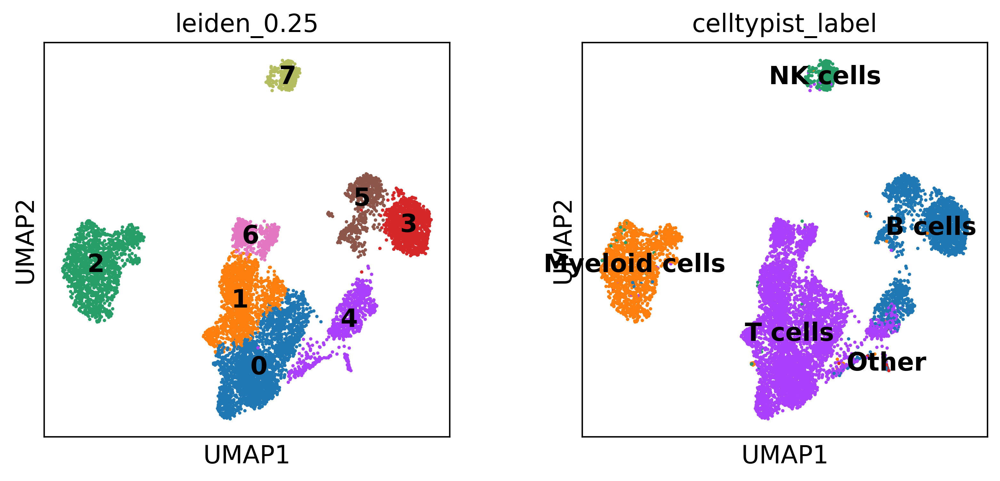

In [15]:
sc.pl.umap(
    donor_1_mdata['rna'], 
    color=['leiden_0.25', 'celltypist_label'],
    legend_loc="on data",
)

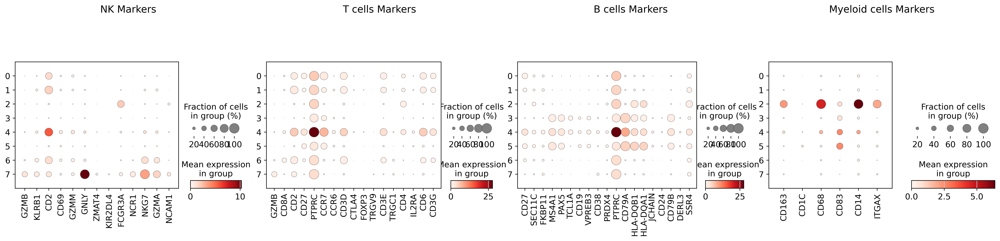

In [16]:
plot_marker_expression(
    adata=donor_1_mdata['rna'],
    markers=markers_t_nk,
    groupby='leiden_0.25',
)

In [17]:
donor_1_mdata['rna'].uns.pop('log1p')

{}

In [18]:
del donor_1_mdata.raw

In [19]:
sc.tl.rank_genes_groups(donor_1_mdata['rna'], groupby='leiden_0.25')

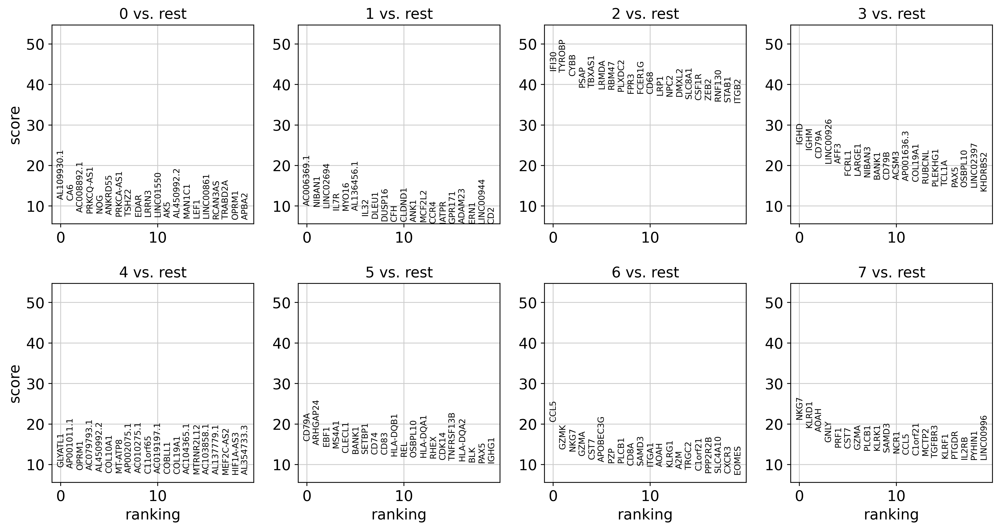

In [20]:
sc.pl.rank_genes_groups(donor_1_mdata['rna'])

We drop Leiden cluster 4 due to inconclusive marker gene expression.

In [21]:
cell_type_to_leiden_clusters = {
    'Myeloid cells': [2],
    'B cells': [3, 5],
    'NK cells': [7],
    'T cells': [0, 1, 6],
}

In [22]:
cell_type_to_leiden_clusters_df = pd.Series(cell_type_to_leiden_clusters).explode().reset_index()
cell_type_to_leiden_clusters_df = cell_type_to_leiden_clusters_df \
    .rename(columns={'index': 'cell_type', 0: 'leiden_cluster'})
leiden_cluster_to_cell_type = cell_type_to_leiden_clusters_df.set_index('leiden_cluster')['cell_type'].to_dict()

In [23]:
donor_1_mdata['rna'].obs['cell_type'] = donor_1_mdata['rna'].obs['leiden_0.25'] \
    .astype(int) \
    .map(leiden_cluster_to_cell_type)

In [24]:
donor_1_mdata['rna'].obs['cell_type'].value_counts(normalize=True, dropna=False)

T cells          0.514420
B cells          0.196939
Myeloid cells    0.167628
NaN              0.084403
NK cells         0.036610
Name: cell_type, dtype: float64

### Donor 2

In [25]:
donor_2_selection = mdata['rna'].obs['donor_id'].eq("Donor 2")
donor_2_mdata = mdata[donor_2_selection].copy()

In [26]:
donor_2_mdata['rna']

AnnData object with n_obs × n_vars = 9586 × 17438
    obs: 'library', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'n_genes', 'doublet_scores', 'doublet_scores_smoothed', 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'cell_type', 'donor_id'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'hvg', 'leiden', 'library_colors', 'log1p', 'neighbors', 'pca', 'umap', 'donor_id_colors'
    obsm: 'X_pca', 'X_umap', 'ora_estimate', 'ora_pvals'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [27]:
donor_2_mdata['rna'].obs = donor_2_mdata['rna'].obs.drop(columns=['leiden_1.0'])
sc.pp.highly_variable_genes(donor_2_mdata['rna'], flavor='cell_ranger', n_top_genes=4000)

sc.pp.pca(donor_2_mdata['rna'], n_comps=20, use_highly_variable=True)
sc.pp.neighbors(donor_2_mdata['rna'])
sc.tl.umap(donor_2_mdata['rna'])

sc.tl.leiden(
    donor_2_mdata['rna'], 
    resolution=0.25, 
    key_added="leiden_0.25", 
    random_state=0,
)

In [28]:
cell_type_predictions = celltypist.annotate(
    mdata['rna'], 
    model=celltypist_immune_model, 
    majority_voting=True,
)

donor_2_mdata['rna'].obs["celltypist_label"] = cell_type_predictions.predicted_labels.predicted_labels
donor_2_mdata['rna'].obs['celltypist_label'] = donor_2_mdata['rna'] \
    .obs['celltypist_label'] \
    .map(celltypist_label_mapping) \
    .fillna('Other')

🔬 Input data has 26335 cells and 17438 genes
🔗 Matching reference genes in the model
🧬 4941 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 15
🗳️ Majority voting the predictions
✅ Majority voting done!


... storing 'celltypist_label' as categorical


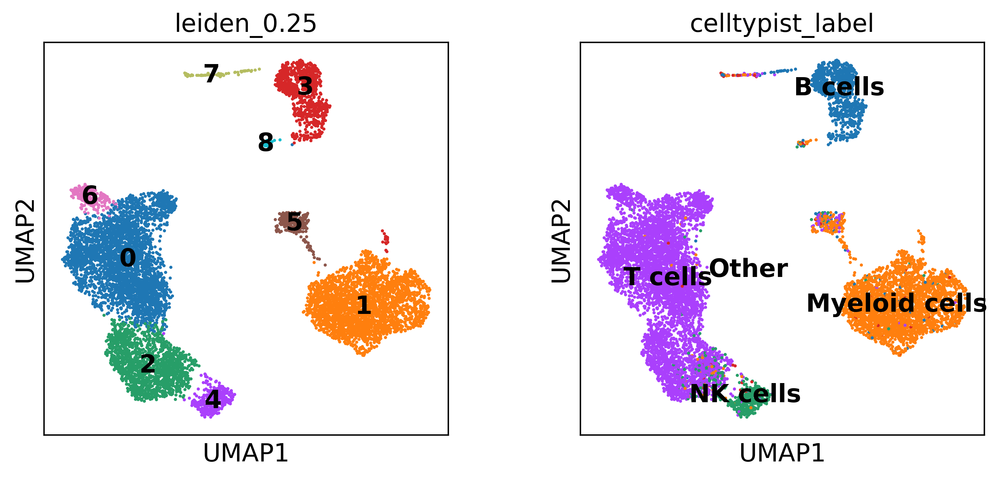

In [29]:
sc.pl.umap(
    donor_2_mdata['rna'], 
    color=['leiden_0.25', 'celltypist_label'],
    legend_loc="on data",
)

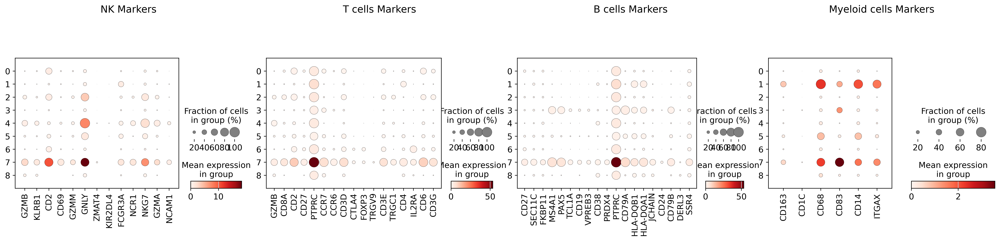

In [30]:
plot_marker_expression(
    adata=donor_2_mdata['rna'],
    markers=markers_t_nk,
    groupby='leiden_0.25',
)

In [31]:
donor_2_mdata['rna'].uns.pop('log1p')

{}

In [32]:
del donor_2_mdata.raw

In [33]:
sc.tl.rank_genes_groups(donor_2_mdata['rna'], groupby='leiden_0.25')

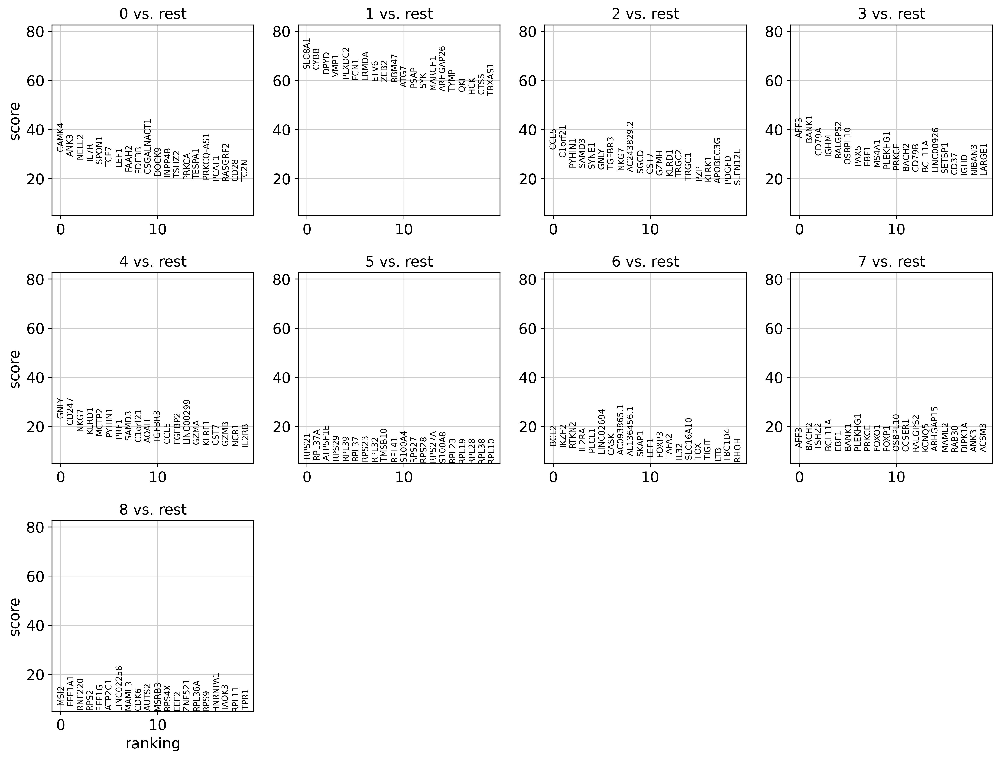

In [34]:
sc.pl.rank_genes_groups(donor_2_mdata['rna'])

We drop Leiden clusters 5, 7, and 8 due to inconclusive marker gene expression.

In [35]:
cell_type_to_leiden_clusters = {
    'Myeloid cells': [1],
    'B cells': [3],
    'NK cells': [4],
    'T cells': [0, 2, 6],
}

In [36]:
cell_type_to_leiden_clusters_df = pd.Series(cell_type_to_leiden_clusters).explode().reset_index()
cell_type_to_leiden_clusters_df = cell_type_to_leiden_clusters_df \
    .rename(columns={'index': 'cell_type', 0: 'leiden_cluster'})
leiden_cluster_to_cell_type = cell_type_to_leiden_clusters_df.set_index('leiden_cluster')['cell_type'].to_dict()

In [37]:
donor_2_mdata['rna'].obs['cell_type'] = donor_2_mdata['rna'].obs['leiden_0.25'] \
    .astype(int) \
    .map(leiden_cluster_to_cell_type)

In [38]:
donor_2_mdata['rna'].obs['cell_type'].value_counts(normalize=True, dropna=False)

T cells          0.555498
Myeloid cells    0.277175
B cells          0.092113
NK cells         0.038911
NaN              0.036303
Name: cell_type, dtype: float64

### Donor 3

In [39]:
donor_3_selection = mdata['rna'].obs['donor_id'].eq("Donor 3")
donor_3_mdata = mdata[donor_3_selection].copy()

In [40]:
donor_3_mdata['rna']

AnnData object with n_obs × n_vars = 8254 × 17438
    obs: 'library', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'n_genes', 'doublet_scores', 'doublet_scores_smoothed', 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'cell_type', 'donor_id'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'hvg', 'leiden', 'library_colors', 'log1p', 'neighbors', 'pca', 'umap', 'donor_id_colors'
    obsm: 'X_pca', 'X_umap', 'ora_estimate', 'ora_pvals'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [41]:
donor_3_mdata['rna'].obs = donor_3_mdata['rna'].obs.drop(columns=['leiden_1.0'])
sc.pp.highly_variable_genes(donor_3_mdata['rna'], flavor='cell_ranger', n_top_genes=4000)

sc.pp.pca(donor_3_mdata['rna'], n_comps=20, use_highly_variable=True)
sc.pp.neighbors(donor_3_mdata['rna'])
sc.tl.umap(donor_3_mdata['rna'])

sc.tl.leiden(
    donor_3_mdata['rna'], 
    resolution=0.25, 
    key_added="leiden_0.25", 
    random_state=0,
)

In [42]:
cell_type_predictions = celltypist.annotate(
    mdata['rna'], 
    model=celltypist_immune_model, 
    majority_voting=True,
)

donor_3_mdata['rna'].obs["celltypist_label"] = cell_type_predictions.predicted_labels.predicted_labels
donor_3_mdata['rna'].obs['celltypist_label'] = donor_3_mdata['rna'] \
    .obs['celltypist_label'] \
    .map(celltypist_label_mapping) \
    .fillna('Other')

🔬 Input data has 26335 cells and 17438 genes
🔗 Matching reference genes in the model
🧬 4941 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 15
🗳️ Majority voting the predictions
✅ Majority voting done!


... storing 'celltypist_label' as categorical


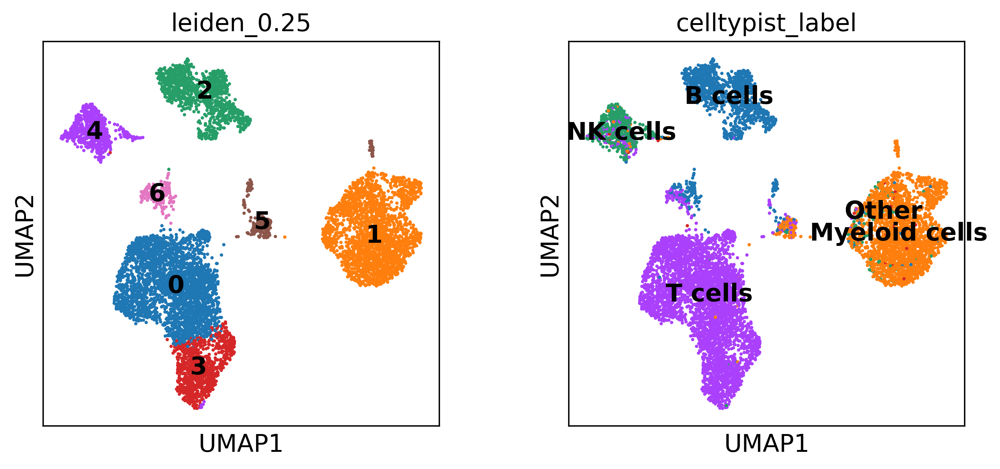

In [43]:
sc.pl.umap(
    donor_3_mdata['rna'], 
    color=['leiden_0.25', 'celltypist_label'],
    legend_loc="on data",
)

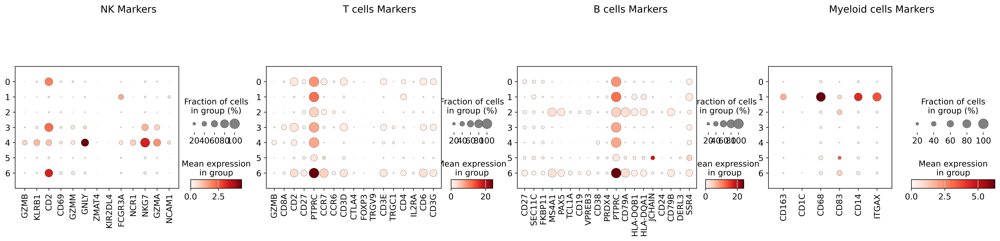

In [44]:
plot_marker_expression(
    adata=donor_3_mdata['rna'],
    markers=markers_t_nk,
    groupby='leiden_0.25',
)

In [45]:
donor_3_mdata['rna'].uns.pop('log1p')

{}

In [46]:
del donor_3_mdata.raw

In [47]:
sc.tl.rank_genes_groups(donor_3_mdata['rna'], groupby='leiden_0.25')

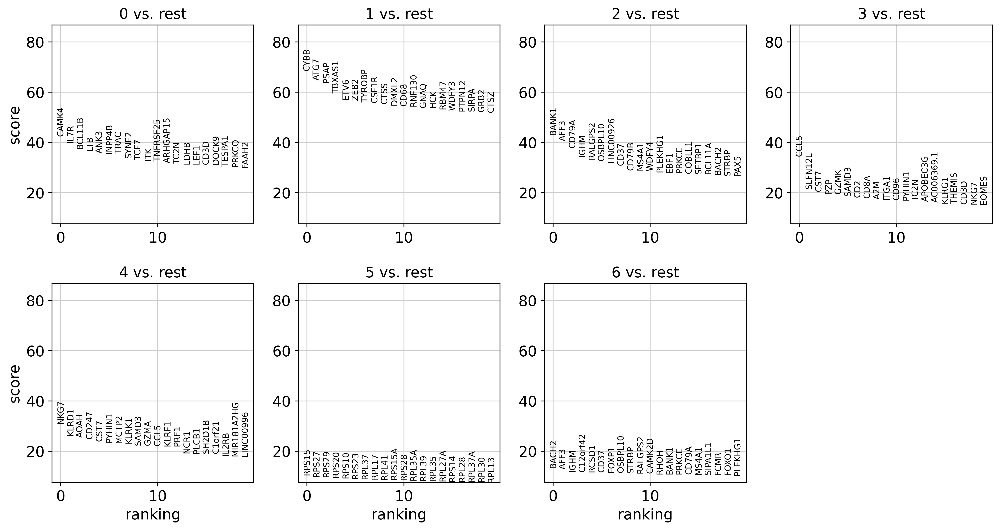

In [48]:
sc.pl.rank_genes_groups(donor_3_mdata['rna'])

We drop Leiden clusters 5 and 6 due to inconclusive marker gene expression.

In [49]:
cell_type_to_leiden_clusters = {
    'Myeloid cells': [1],
    'B cells': [2],
    'NK cells': [4],
    'T cells': [0, 3],
}

In [50]:
cell_type_to_leiden_clusters_df = pd.Series(cell_type_to_leiden_clusters).explode().reset_index()
cell_type_to_leiden_clusters_df = cell_type_to_leiden_clusters_df \
    .rename(columns={'index': 'cell_type', 0: 'leiden_cluster'})
leiden_cluster_to_cell_type = cell_type_to_leiden_clusters_df.set_index('leiden_cluster')['cell_type'].to_dict()

In [51]:
donor_3_mdata['rna'].obs['cell_type'] = donor_3_mdata['rna'].obs['leiden_0.25'] \
    .astype(int) \
    .map(leiden_cluster_to_cell_type)

In [52]:
donor_3_mdata['rna'].obs['cell_type'].value_counts(normalize=True, dropna=False)

T cells          0.465835
Myeloid cells    0.276714
B cells          0.128907
NK cells         0.080204
NaN              0.048340
Name: cell_type, dtype: float64

In [53]:
donor_1_mdata['rna'].obs['cell_type']

ACAAACTGTTACAAAC-1              NaN
TTGCGAGTCCCGTTGT-1          T cells
CCTTGCGTCCTCGATC-1    Myeloid cells
CGTCATTGTTCGCGCT-1          T cells
CTGAAACTCAATGTGC-1    Myeloid cells
                          ...      
AGTTTGCAGCAAGGTA-1          T cells
GGCTGTCAGCGGATAA-1          B cells
GAACCAGCAAATGCCC-1          T cells
GCAGGAAGTAGCTAAT-1    Myeloid cells
AATTACCCAATATAGG-1          T cells
Name: cell_type, Length: 8495, dtype: object

In [54]:
donor_1_mdata['rna'].obs['cell_type']

ACAAACTGTTACAAAC-1              NaN
TTGCGAGTCCCGTTGT-1          T cells
CCTTGCGTCCTCGATC-1    Myeloid cells
CGTCATTGTTCGCGCT-1          T cells
CTGAAACTCAATGTGC-1    Myeloid cells
                          ...      
AGTTTGCAGCAAGGTA-1          T cells
GGCTGTCAGCGGATAA-1          B cells
GAACCAGCAAATGCCC-1          T cells
GCAGGAAGTAGCTAAT-1    Myeloid cells
AATTACCCAATATAGG-1          T cells
Name: cell_type, Length: 8495, dtype: object

## Combining per-donor annotations

In [55]:
donor_1_cell_type_map = donor_1_mdata['rna'].obs['cell_type'].to_dict()
donor_2_cell_type_map = donor_2_mdata['rna'].obs['cell_type'].to_dict()
donor_3_cell_type_map = donor_3_mdata['rna'].obs['cell_type'].to_dict()

cell_type_map = {
    **donor_1_cell_type_map, 
    **donor_2_cell_type_map,
    **donor_3_cell_type_map,
}

In [56]:
mdata['rna'].obs['cell_type'] = mdata['rna'].obs.index.map(cell_type_map)
mdata['atac'].obs['cell_type'] = mdata['rna'].obs.index.map(cell_type_map)

In [57]:
null_selection = mdata['rna'].obs['cell_type'].isnull()
mdata = mdata[~null_selection].copy()

### snRNA-seq UMAPs

In [58]:
sc.pp.highly_variable_genes(mdata['rna'], flavor='cell_ranger', n_top_genes=4000)

sc.pp.pca(mdata['rna'], n_comps=20, use_highly_variable=True)
sc.pp.neighbors(mdata['rna'])
sc.tl.umap(mdata['rna'])

... storing 'cell_type' as categorical


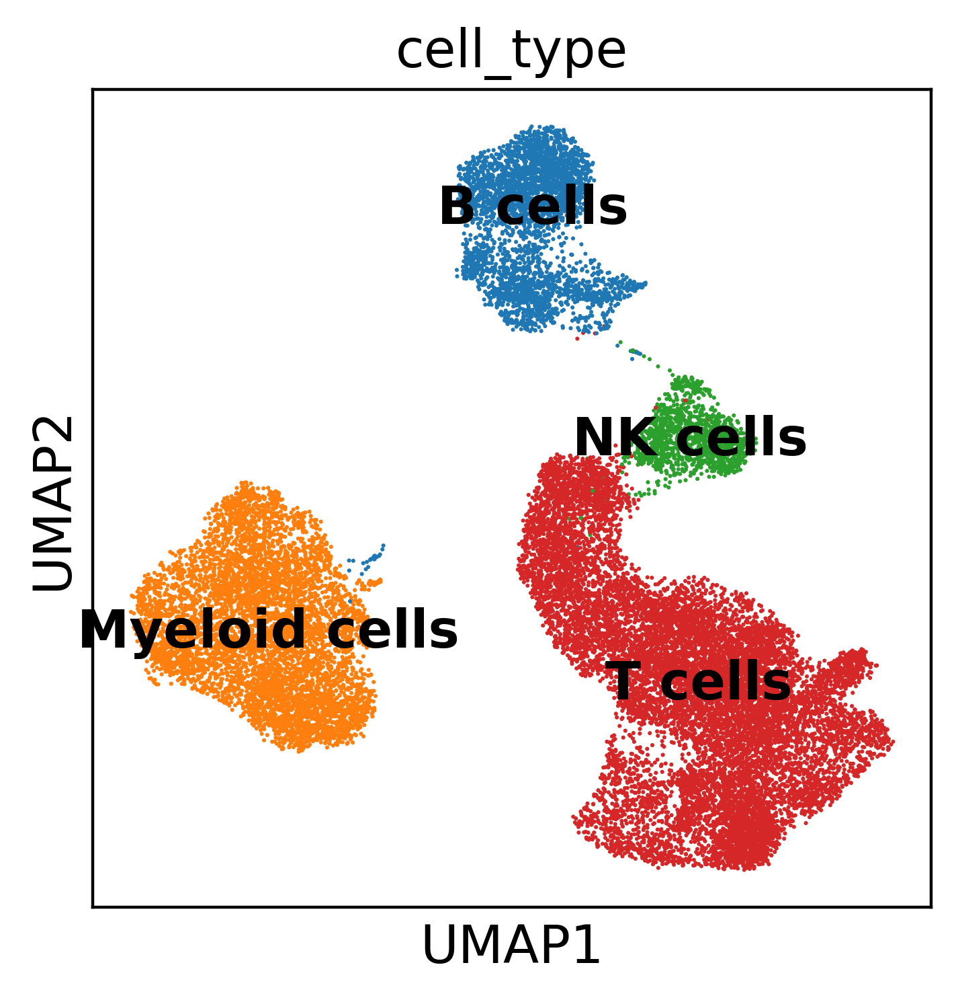

In [59]:
sc.pl.umap(
    mdata['rna'], 
    color=['cell_type'],
    legend_loc="on data",
)

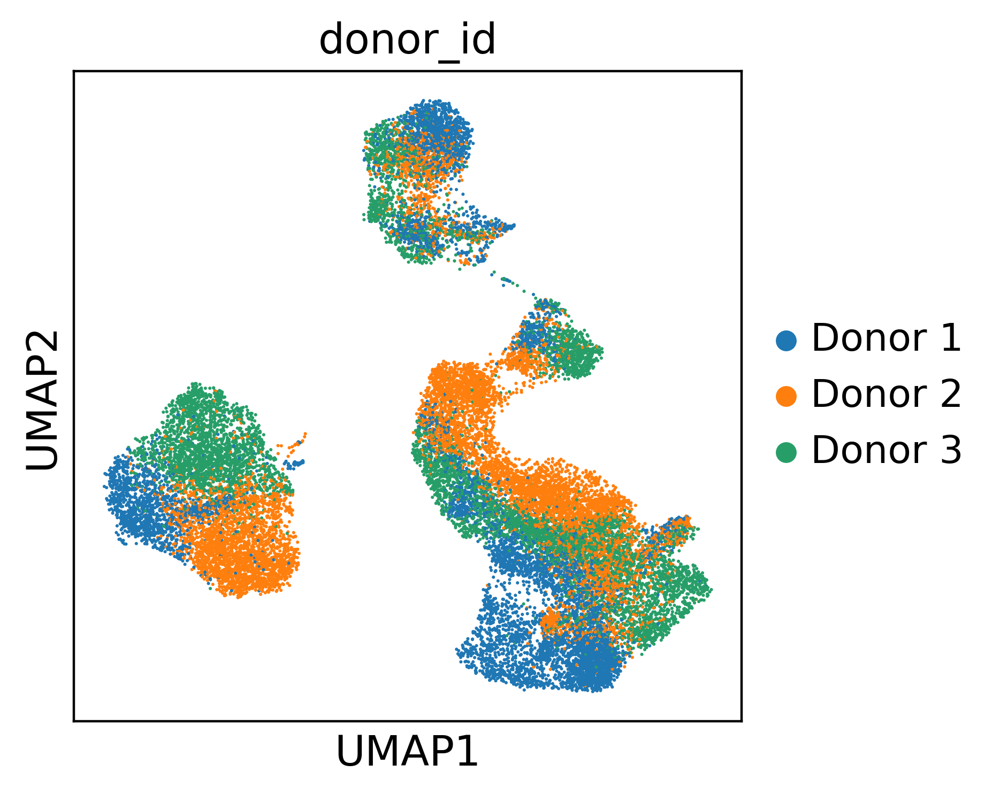

In [60]:
sc.pl.umap(
    mdata['rna'], 
    color=['donor_id'],
)

### scATAC-seq UMAPs

In [61]:
sc.pp.highly_variable_genes(mdata['atac'], flavor='cell_ranger', n_top_genes=10000)

sc.pp.pca(mdata['atac'], n_comps=30, use_highly_variable=True)
sc.pp.neighbors(mdata['atac'])
sc.tl.umap(mdata['atac'])

... storing 'cell_type' as categorical


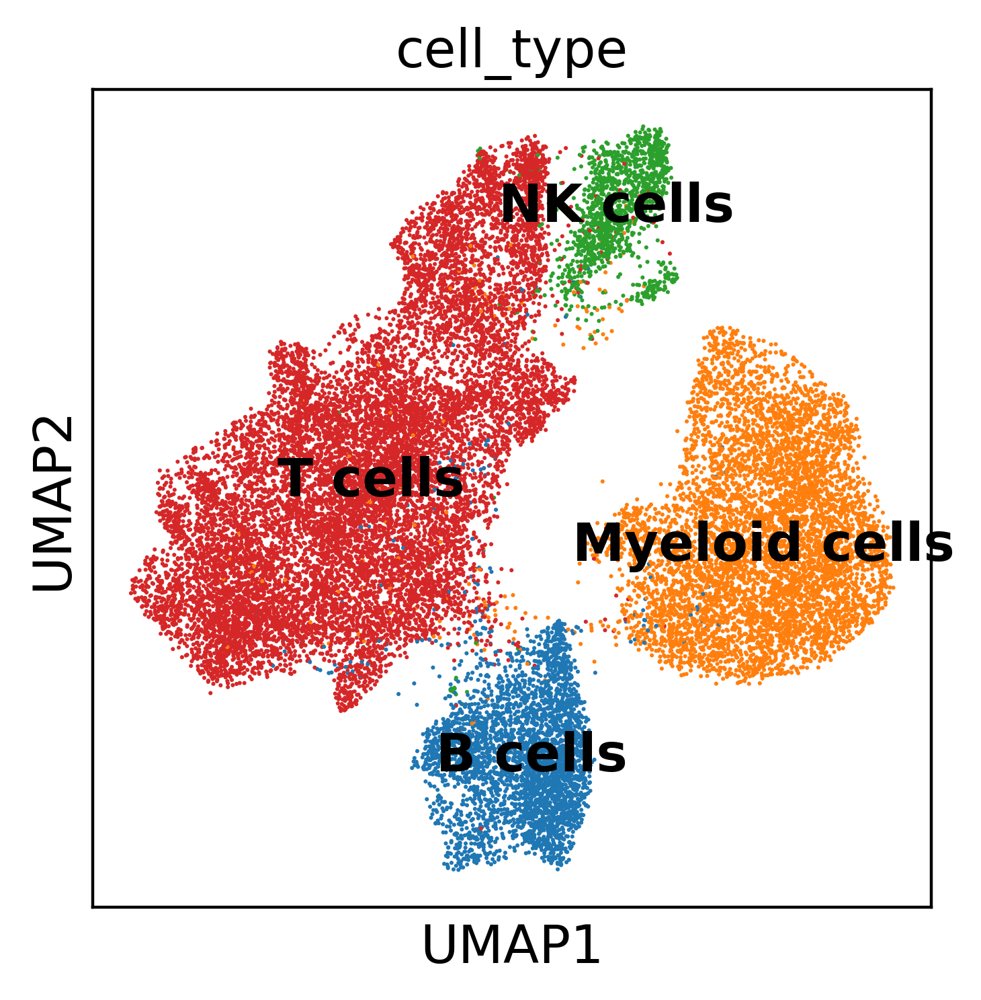

In [62]:
sc.pl.umap(
    mdata['atac'], 
    color=['cell_type'],
    legend_loc="on data",
)

In [ ]:
sc.pl.umap(
    mdata['atac'], 
    color=['donor_id'],
)

## Writing to disk

In [ ]:
mdata.write_h5mu(os.path.join('../data', 'multiome_counts_reannotated.h5mu'))